In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt 
%matplotlib inline
import carto2gpd
from colorcet import cm
import datashader as ds
from holoviews.operation.datashader import rasterize, shade
from shapely.geometry import Point

import holoviews as hv
import hvplot.pandas
import param as pm
import panel as pn
import geoviews as gv

import altair as alt
import folium
from folium.plugins import HeatMap

import textblob
import requests
from bs4 import BeautifulSoup
import string
import nltk
nltk.download('stopwords');

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\HanyongXu\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
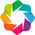

In [2]:
alt.renderers.enable('notebook');
pn.extension('vega')
hv.extension('bokeh')

### Tweet Sentiment Analysis

In [3]:
source = pd.read_csv('Data/sentiment_output.csv')
brush = alt.selection(type='interval')

points = alt.Chart(source, title = "Polarity vs. subjectivity of tweets related to food").mark_point().encode(
    x='subjectivity:Q',
    y='polarity:Q',
    color=alt.condition(brush, 'category:N', alt.value('grey')),
    tooltip=['subjectivity','polarity','category'],
).add_selection(brush)

bars = alt.Chart(source).mark_bar().encode(
    y='category:N',
    color='category:N',
    x='count(category):Q',
    tooltip=['category','count(category)'],
).transform_filter(
    brush
)

instructions = alt.Chart(
    {"values": [{"text": "Box select the points on the scatter plot to view their distribution in the bar chart below."}]}
).mark_text(size=12).encode(
    text="text:N"
).configure_view(strokeOpacity=0)

In [4]:
counts_final = pd.read_csv('Data/word_frequency.csv')

In [5]:
chart = alt.Chart(counts_final, title='Frequency of words related to food').mark_bar(color='#E74C3C').encode(
    x='count:Q',
    y=alt.Y(
        'words:N',
        sort=alt.EncodingSortField(
            field="count", 
            order="descending"  
        )
    ),
    tooltip=['count']
).properties(
    height=400
)
chart

In [6]:
points & bars

In [7]:
altair_instruction = pn.panel(instructions)
altair_sentiment = pn.panel(points & bars)
altair_wordfrequency = pn.panel(chart, width = 500,)

### Demographic Characteristics of Queens & Brooklyn

In [8]:
demo = gpd.read_file('Data/tracts_dist.geojson')

In [9]:
demo = demo.loc[demo['TOT_POP'] != 0]

In [10]:
list(demo)

['STATEFP10',
 'COUNTYFP10',
 'TRACTCE10',
 'GEOID10',
 'NAME10',
 'NAMELSAD10',
 'MTFCC10',
 'FUNCSTAT10',
 'ALAND10',
 'AWATER10',
 'INTPTLAT10',
 'INTPTLON10',
 'NAME',
 'TOT_POP',
 'WHI_POP',
 'BLA_POP',
 'ASI_POP',
 'MED_INC',
 'TOT_HOUS',
 'NON_VEH_HOU',
 'state',
 'county',
 'tract',
 'prt_whi',
 'prt_bla',
 'prt_asi',
 'prt_veh',
 'AREA',
 'pop_den',
 'cnt',
 'FoodDesertOrNot',
 'fast_food',
 'market',
 'convenience',
 'supermarket',
 'geometry']

In [11]:
col=demo.columns.values

In [12]:
col=['STATEFP10',
 'COUNTYFP10',
 'TRACTCE10',
 'GEOID10',
 'NAME10',
 'NAMELSAD10',
 'MTFCC10',
 'FUNCSTAT10',
 'ALAND10',
 'AWATER10',
 'INTPTLAT10',
 'INTPTLON10',
 'NAME',
 'Total Population',
 'WHI_POP',
 'BLA_POP',
 'ASI_POP',
 'Median Income',
 'TOT_HOUS',
 'NON_VEH_HOU',
 'state',
 'county',
 'tract',
 'Percent of White',
 'Percent of Black',
 'Percent of Asian',
 'Percent of Non-vehicle Households',
 'AREA',
 'Population Density',
 'Numbers of Public Transit Stations',
 'FoodDesertOrNot',
 'fast_food',
 'market',
 'convenience',
 'supermarket',
 'geometry']

In [13]:
demo.columns=col

In [14]:
demo['Median Income'] = [0 if x < 0 else x for x in demo['Median Income']]

In [15]:
cmaps = ['fire','bgy','bgyw','bmy','gray','kbc']

In [16]:
demo_options = [ 'Percent of White', 'Percent of Black',
       'Percent of Asian', 'Percent of Non-vehicle Households', 
       'Population Density', 'Numbers of Public Transit Stations', 'Median Income']

In [17]:
class Demographics(pm.Parameterized):
    
    # Map opacity
    #alpha = pm.Magnitude(default=0.75, doc="Alpha value for the map opacity")
    demographic_feature = pm.ObjectSelector(default = "Median Income", objects= demo_options)
    cmap = pm.ObjectSelector(cm["fire"], objects={c: cm[c] for c in cmaps})
    
    @pm.depends("demo_option")
    def chloropleth(self, **kwargs):
        chloroplethchart=demo.hvplot.polygons(c=self.param.demographic_feature,
                                 height = 450,
                                 width = 550,
                                 crs=3857,
                                 geo=True,
                                 xaxis=None, 
                                 yaxis=None,
                                 line_color='white',
                                 line_width=.7,
                                 cmap = self.param.cmap,
                                 dynamic=False,
                                 tiles = 'CartoMidnight'
                            )
        
        return chloroplethchart
    
    @pm.depends("demo_option")
    def histogram(self, **kwargs):
        demo_pd = pd.DataFrame(demo)
        histogram = demo_pd.hvplot.hist(y=self.param.demographic_feature, width = 350, height = 350, 
                                        color = '#f29c50',line_color = 'white')
        return histogram

### Street Network Vis

In [18]:
network_data = pd.read_csv('Data//dist.csv')

In [19]:
network_data = gpd.GeoDataFrame(network_data, geometry=gpd.points_from_xy(network_data.x, network_data.y), crs={"init": "epsg:4326"})
network_data = network_data.to_crs({'init': 'epsg:3857'})
network_data['x_col'] = network_data['geometry'].x
network_data['y_col'] = network_data['geometry'].y
network_data = network_data.drop(columns = ['geometry','Unnamed: 0'])

In [20]:
opts = dict(xaxis=None, yaxis=None, bgcolor="black", show_grid=False)

In [21]:
class DistanceApp(pm.Parameterized):

    # Map opacity
    alpha = pm.Magnitude(default=0.75, doc="Alpha value for the map opacity")
    
    # Colormap
    cmap = pm.ObjectSelector(cm["fire"], objects={c: cm[c] for c in cmaps})
    
    # Distance to Amenity
    distance = pm.Integer(500, bounds=(200, 3000))

    # Nth node
    The_Closest_Nth_Amenity = pm.ObjectSelector(default='1', objects=['1', '2', '3', '4','5'])
    
    # Amenity
    Amenity_1 = pm.ObjectSelector(default='fastfood', objects=['fastfood', 'convenience', 'market', 'supermarket'])
    Amenity_2 = pm.ObjectSelector(default='supermarket', objects=['fastfood', 'convenience', 'market', 'supermarket'])

    # Selection that gives the current x_range/y_range of the map
    box = hv.streams.RangeXY(x_range=None, y_range=None)

    @pm.depends("Amenity_1", "The_Closest_Nth_Amenity", "distance")
    def points(self, x_range=None, y_range=None):

        # create the Points object holding all data
        value = f"{self.Amenity_1}_{self.The_Closest_Nth_Amenity}"
        di = self.distance
        xcol = 'x_col'
        ycol = 'y_col'
        points = hv.Points(network_data[network_data[value]<di], kdims=[xcol, ycol], vdims=[value])
        
        # trim by x range of plot
        if x_range is not None:
            points = points.select(**{xcol: x_range})

        # trim by y range of plot
        if y_range is not None:
            points = points.select(**{ycol: y_range})

        return points

    def heatmap(self, **kwargs):
        """
        Return a datashaded heatmap of the taxi trips.
        """

        # create a dynamic map using the points() function
        # and link the box selection stream to the map
        points = hv.DynamicMap(self.points, streams=[self.box])

        # aggregate the points by counting them up on a mesh
        agg = rasterize(points, x_sampling=1, y_sampling=1, width=550, height=420)

        # the background tiles
        tiles = gv.tile_sources.CartoMidnight().apply.opts(alpha=self.param.alpha, **opts)

        # return datashaded heatmap
        heatmap = tiles * shade(agg, cmap=self.param.cmap)

        return heatmap.options(
            default_tools=["save", "pan", "box_zoom", "reset"],
            active_tools=["box_zoom"],
            width=550,
            height=420,
            title="Distance of street network nodes to amenities",
            fontsize={'title': 10}
        )

    @pm.depends("Amenity_1", "Amenity_2","box.x_range", "box.y_range")
    def passenger_hist(self):
        
        # Trim to 5000 to allow altair to plot
        DATA_trim = network_data[(network_data[f'{self.Amenity_1}_1']<5000) & (network_data[f'{self.Amenity_2}_1']<5000)]
        N = 5000
        DATA_trim = DATA_trim.sample(N)

        # make the Altair chart
        chart = (
            alt.Chart(DATA_trim, title='Associations between amenities')
            .mark_circle(size = 20,color='#f29c50')
            .encode(
                x=alt.X(f'{self.Amenity_1}_1:Q',title = f'Distance to {self.Amenity_1}'),
                y=alt.Y(f'{self.Amenity_2}_1:Q',title = f'Distance to {self.Amenity_2}'),
                tooltip=['x', 'y', f'{self.Amenity_1}_1', f'{self.Amenity_2}_1']
            ).properties(width=300, height=300).interactive()
        )

        return pn.Pane(chart, width=800)

### Prediction Results Vis

In [22]:
dat=gpd.read_file('Data/final_version_deo_spa_net_pre.geojson')

In [23]:
dat.columns

Index(['STATEFP10', 'COUNTYFP10', 'TRACTCE10', 'GEOID10', 'NAME10',
       'NAMELSAD10', 'MTFCC10', 'FUNCSTAT10', 'ALAND10', 'AWATER10',
       'INTPTLAT10', 'INTPTLON10', 'NAME', 'TOT_POP', 'WHI_POP', 'BLA_POP',
       'ASI_POP', 'MED_INC', 'TOT_HOUS', 'NON_VEH_HOU', 'state', 'county',
       'tract', 'prt_whi', 'prt_bla', 'prt_asi', 'prt_veh', 'AREA', 'pop_den',
       'cnt', 'FoodDesertOrNot', 'fast_food', 'market', 'convenience',
       'supermarket', 'prediction', 'geometry'],
      dtype='object')

In [24]:
default = hv.Cycle(['red', 'orange', 'yellow'])

In [25]:
cmaps_b = ['cwr','bgy','bmy',"coolwarm"]

In [26]:
class Prediction(pm.Parameterized):
    # Colormap
    cmap=pm.ObjectSelector(cm['coolwarm'],objects={c:cm[c] for c in cmaps_b})

    def plot(self): 
        return dat.hvplot.polygons(
            c="prediction",
            cmap=self.param.cmap,
            line_alpha=1,
            line_color="white",
            line_width=.7,
            hover_cols=['NAMELSAD10',"FoodDesertOrNot",'prediction'],
            width=460,
            height=400,
            xaxis=None, 
            yaxis=None,
            tiles = 'CartoMidnight'
        )
    def plot1(self): 
        return dat.hvplot.polygons(
            c="FoodDesertOrNot",
            cmap=self.param.cmap,
            line_alpha=1,
            line_color="white",
            line_width=.7,
            hover_cols=['NAMELSAD10',"FoodDesertOrNot",'prediction'],
            width=460,
            height=400,
            xaxis=None, 
            yaxis=None,
            tiles = 'CartoMidnight'
        )

In [27]:
need_col=["NAMELSAD10",'AREA','geometry']
demo_new=dat[need_col]
demo_new=demo_new.to_crs(epsg=4326).to_json()

In [28]:
def get_style(feature):
    return {'weight': 2, 'color': '#99ccff'}

def get_highlighted_style(feature):
    return {'weight': 2, 'color': '#001eff'}

In [29]:
m = folium.Map(
    location=[40.688689, -73.879654],
    tiles="Cartodb Positron",
    zoom_start=11
)

folium.GeoJson(
    demo_new,
    name="census_tract",
    style_function=get_style,
    highlight_function=get_highlighted_style,
    tooltip=folium.GeoJsonTooltip(["NAMELSAD10",'AREA'])
).add_to(m)

figure=folium.Figure(width=910,height=550)
m.add_to(figure)

In [30]:
folium_map= pn.panel(figure)

In [31]:
png_pane = pn.pane.PNG('Data/confusion_matrix.png', width=300)

### Initiate apps and format panel

In [32]:
app=Prediction(name="")

In [33]:
app_network = DistanceApp(name="")

In [34]:
app_demo = Demographics(name="")

In [35]:
title = pn.pane.HTML("<h2>Predicting Food Deserts in Queens and Brooklyn, New York</h2>", 
                style={"width": "400px", "text-align": "left"})

In [52]:
title_p=pn.pane.HTML('<h2>Prediction Results</h2>',style={"width": "800px", "text-align": "left"})

In [53]:
title_pp=pn.pane.HTML('<h4>Predictions vs. True Food Deserts</h4>',style={"width": "800px", "text-align": "left"})

In [37]:
subtitle = pn.pane.HTML("<br><br><h2>Tweets Analysis</h2>", 
                style={"width": "800px", "text-align": "left"})

In [38]:
subtitle2 = pn.pane.HTML("<h2>Demographic Analysis</h2>", 
                style={"width": "800px", "text-align": "left"})

In [39]:
subtitle3 = pn.pane.HTML("<h2>Street Network Analysis</h2>", 
                style={"width": "800px", "text-align": "left"})

In [40]:
folium_title=pn.pane.HTML(
    "<h2>Background: Brooklyn and Queens, NY</h2>", width=800
)

In [41]:
author = pn.pane.HTML("<i>Xintian Li, Hanyong Xu, Yujing Wu 12/15/2019</i>", width = 385)

In [42]:
description = pn.pane.HTML('''
<p6>Access to healthy and affordable food sources can be difficult in many parts of the United States, 
even in big cities like New York. According to the United States Department of Agriculture (USDA), 
about 13.5 million Americans have limited access to supermarkets or grocery stores and 82% of them live in urban areas. 
In order to improve public health and general welfare, it is important to correctly identify food deserts, 
which is defined as low-income census tracts in which a large amount or percentage of residents have difficulty access to retail outlets selling healthy and affordable food. 
Through this project, we explored the issue of food deserts within Brooklyn and Queens in New York, United States. 
<br><br>  Previously, Michael J.Widener and Wenwen Li explored the relationship between food deserts and healthy and unhealthy food in tweets in Using geolocated 
Twitter data to monitor the prevalence of healthy and unhealthy food references across the US. Inspired by their work, 
we looked at food-related tweets generated in Queens and Brooklyn and used them for sentiment analysis. 
We also used demographic characteristics and distance to food-related amenities to predict the presence of food deserts in Brooklyn and Queens, 
New York using a Random Forest machine learning model.</p6>''', width=400)

In [43]:
description1 = pn.pane.HTML("<h4>Demographic feature spatial and statistical distribution</h4>", 
                style={"width": "800px", "text-align": "left"})
description2 = pn.pane.HTML("<h4>Prediction result confusion matrix</h4>", 
                style={"width": "800px", "text-align": "left"})

In [44]:
title_network = pn.pane.HTML(
    "<p6>Amenity 1 only modifies the map, while both Amenity 1 and 2 modify the plot.</p6>",
    style={"width": "800px", "text-align": "left"},
)

In [60]:
panel = pn.Column(
    pn.Row(pn.Spacer(width=15), title, align = 'start'), 
    pn.Row(pn.Spacer(width=15), author, pn.Spacer(width=50), folium_title),
    pn.Row(pn.Spacer(width=15), description, pn.Spacer(width=40), folium_map),
    pn.Row(pn.Spacer(width=475), subtitle, align = 'start'),
    pn.Row(pn.Spacer(width=955), altair_instruction, height = 30, align = 'start'),
    pn.Row(pn.Spacer(width=390), altair_wordfrequency, altair_sentiment, height=550),
    pn.Row(pn.Spacer(width=475), subtitle2, height = 50, align = 'start'),
    pn.Row(pn.Spacer(width=475), description1, height = 50, align = 'start'),
    pn.Row(pn.Spacer(width=260), pn.Param(app_demo.param, expand_button=False, width=200), app_demo.chloropleth(), pn.Spacer(width=15), app_demo.histogram(), align='start'),
    pn.Row(pn.Spacer(width=475), subtitle3, height = 50, align = 'start'),
    pn.Row(pn.Spacer(width=475), title_network),
    pn.Row(pn.Spacer(width=260), pn.Param(app_network.param, expand_button=False, width=200), app_network.heatmap(), app_network.passenger_hist),
    pn.Row(pn.Spacer(width=475), title_p, height = 50, align = 'start'),
    pn.Row(pn.Spacer(width=475), title_pp, height = 30, align = 'start'),
    pn.Row(pn.Spacer(width=260), pn.Param(app.param, expand_button=False, width=200), app.plot,app.plot1),
    pn.Row(pn.Spacer(width=475), description2),
    pn.Row(pn.Spacer(width=475), png_pane),
    align = "center",
    width = 1200,
    height = 3000
)

Column(align='center', height=3000, sizing_mode='fixed', width=1200)
    [0] Row
        [0] Spacer(width=15)
        [1] HTML(str, style={'width': '400px', ...})
    [1] Row
        [0] Spacer(width=15)
        [1] HTML(str, width=385)
        [2] Spacer(width=50)
        [3] HTML(str, width=800)
    [2] Row
        [0] Spacer(width=15)
        [1] HTML(str, width=400)
        [2] Spacer(width=40)
        [3] HTML(Figure)
    [3] Row
        [0] Spacer(width=475)
        [1] HTML(str, style={'width': '800px', ...})
    [4] Row(height=30)
        [0] Spacer(width=955)
        [1] Vega(Chart)
    [5] Row(height=550)
        [0] Spacer(width=390)
        [1] Vega(Chart, width=500)
        [2] Vega(VConcatChart)
    [6] Row(height=50)
        [0] Spacer(width=475)
        [1] HTML(str, style={'width': '800px', ...})
    [7] Row(height=50)
        [0] Spacer(width=475)
        [1] HTML(str, style={'width': '800px', ...})
    [8] Row
        [0] Spacer(width=260)
        [1] Param(Demographics, expand_button=False, width=200)
        [2] ParamFunction(function)
        [3] Spacer(width=15)
        [4] ParamFunction(function)
    [9] Row(height=50)
        [0] Spacer(width=475)
        [1] HTML(str, style={'width': '800px', ...})
    [10] Row
        [0] Spacer(width=475)
        [1] HTML(str, style={'width': '800px', ...})
    [11] Row
        [0] Spacer(width=260)
        [1] Param(DistanceApp, expand_button=False, width=200)
        [2] HoloViews(DynamicMap)
        [3] ParamMethod(method)
    [12] Row(height=50)
        [0] Spacer(width=475)
        [1] HTML(str, style={'width': '800px', ...})
    [13] Row(height=30)
        [0] Spacer(width=475)
        [1] HTML(str, style={'width': '800px', ...})
    [14] Row
        [0] Spacer(width=260)
        [1] Param(Prediction, expand_button=False, width=200)
        [2] ParamMethod(method)
        [3] ParamMethod(method)
    [15] Row
        [0] Spacer(width=475)
        [1] HTML(str, style={'width': '800px', ...})
    [16] Row
        [0] Spacer(width=475)
        [1] PNG(str, width=300)
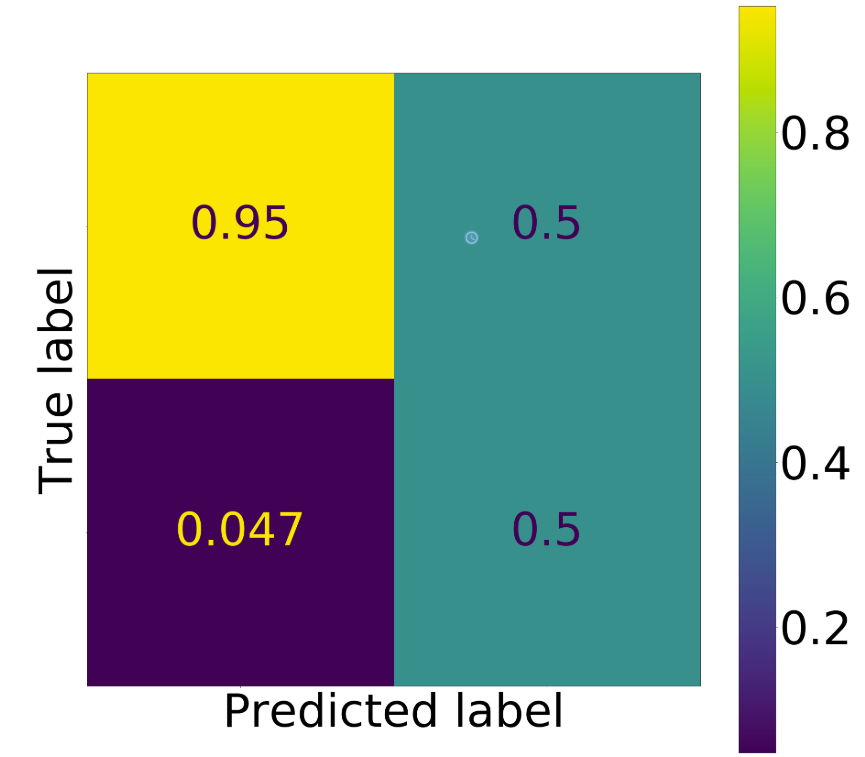

In [61]:
panel.servable()